# pyCrossTalkeR Example - Human Myocardial Infarction

## Cell-Cell Communication Analysis of Human Myocardial Infarction scRNA-seq Data Using pyCrossTalkeR

Here, we demonstrate the usage of pyCrossTalkeR on the case study of human myocardian infarction snRNA-seq data from the Nature paper **Spatial multi-omic map of human myocardial infarction** ([Kuppe et al., 2022](https://www.nature.com/articles/s41586-022-05060-x)). Aim of the study was to build a high-resolution map of human cardiac remodelling after myocardial infarction to provide a better understanding of these remodelling processes. We are focusing here on the conditions “myogenic” (control condition) and “ischemic” (disease condition) and go through the pyCrossTalkeR results step by step. The original paper already contains pyCrossTalkeR results and in a later part of this tutorial we will replicate a few of the results.

### Ligand-Receptor Interaction Prediction with LIANA

Before we can run pyCrossTalkeR, we need the prediction of ligand-receptor interaction for our data set.

The scRNA-seq data contains two conditions: myogenic and ischemic conditions. We show how to execute pyCrossTalkeR and finally go over some of the results, that are also provided inside the resulting pyCrossTalkeR report.

In [1]:
from pycrosstalker import tools as cttl
from pycrosstalker import plots as ctpl
import matplotlib.pyplot as plt
import os
import seaborn as sns
import numpy as np
import plotly
import scanpy as sc
import liana as li
import pandas as pd
import warnings
import networkx as nx
warnings.simplefilter(action="ignore")
plotly.offline.init_notebook_mode()

In [ ]:
adata = sc.read_h5ad("./rawdata/snRNAseq_cellsWithSubtype.h5ad")

adata.raw = adata

adata.uns['liana'] = {}
for i in set(adata.obs['patient_group']):
    if i != 'fibrotic':
        lr=li.method.cellphonedb(adata[adata.obs['patient_group']==i],
                            groupby='cell_subtype2',
                            expr_prop=0.1,
                            verbose=True,
                            resource_name='consensus',
                            inplace=False)
        adata.uns['liana'][i] = lr

In [3]:
adata = cttl.utils.from_liana(adata,liana_key="liana",compute_means=False,pval_filter=True)
adata.uns['pycrosstalker']['details'] = {}
adata.uns['pycrosstalker']['details']['filename'] = "Human_Myocardial_Infarction"

In [4]:
adata.uns['pycrosstalker']['path'].keys()

dict_keys(['myogenic', 'ischemic'])

### Running pyCrossTalkeR

First, we need to import the pyCrossTalkeR libraries (tools and plots). Next, we define a named list of either the paths to the Ligand-Receptor interaction tables, or directly dataframe objects for each condition of interest. Please note that it is possible to run pyCrossTalkeR with more than two conditions. Here we load the files from within the package. We can further define a path where we like to save our results (output) and run pyCrossTalkeR with the `analise_LR()` function from the `generate_report.py` file:

In [5]:
output = "output/HMI_example/"
if not os.path.isdir(output):
    os.mkdir(output)
adata = cttl.analise_LR(adata, out_path=output,comparison=[("ischemic","myogenic")])

Create a Differential Table
Calculating CCI Ranking
Calculating GCI Ranking
Network Analysis Done
Generating h5ad file with Analysed Results


## pyCrossTalkeR Results Ischemic vs Myogenic condition
The second part of this tutorial focuses on the results of the comparative analysis of ischemic versus myogenic conditions.

### CCI Results
We start our result analysis with the cell-cell interaction (CCI) analysis of CrossTalkeR and therefore take a look at our CCI network plot:

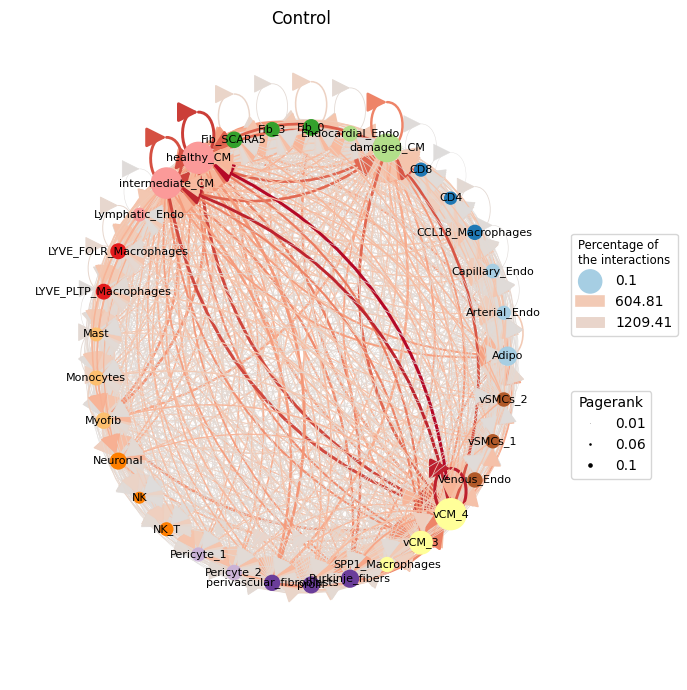

In [6]:
ctpl.plot.plot_cci(graph=adata.uns['pycrosstalker']['results']["graphs"]["myogenic"],
        colors=adata.uns['pycrosstalker']['results']["colors"],
        plt_name='Control',
        coords=adata.uns['pycrosstalker']['results']["coords"],
        emax= None,
        leg= False,
        low= 0,
        high= 0, 
        ignore_alpha= False,
        log= False,
        efactor= 2,
        vfactor= 0.03, 
        pg= adata.uns['pycrosstalker']['results']["rankings"]["myogenic"]["Pagerank"],
        figsize= (7, 7),
        scale_factor= 2.0,
        node_size=5.0,
        font_size=8,
        )

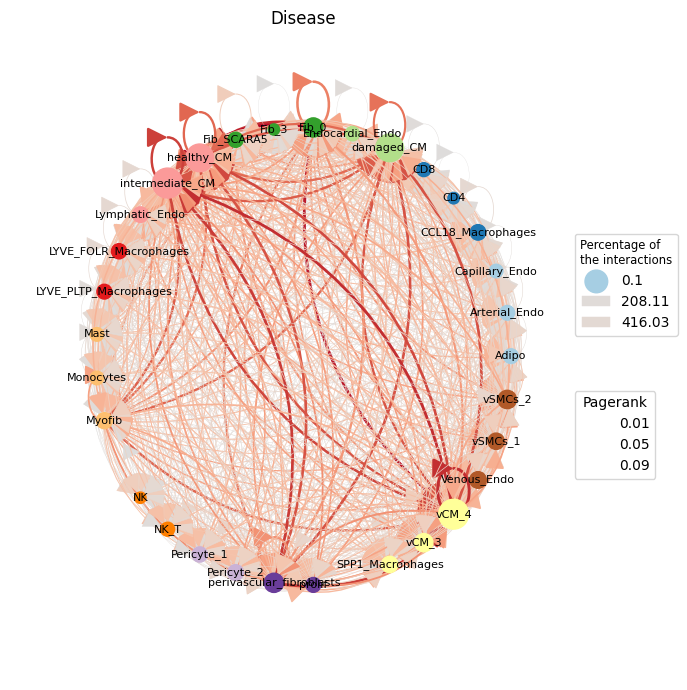

In [7]:
ctpl.plot.plot_cci(graph=adata.uns['pycrosstalker']['results']["graphs"]["ischemic"],
        colors=adata.uns['pycrosstalker']['results']["colors"],
        plt_name='Disease',
        coords=adata.uns['pycrosstalker']['results']["coords"],
        emax= None,
        leg= False,
        low= 0,
        high= 0, 
        ignore_alpha= False,
        log= False,
        efactor= 2,
        vfactor= 12, 
        pg= adata.uns['pycrosstalker']['results']["rankings"]["ischemic"]["Pagerank"],
        figsize= (7, 7),
        scale_factor= 2.0,
        node_size=5.0,
        font_size=8,
        )

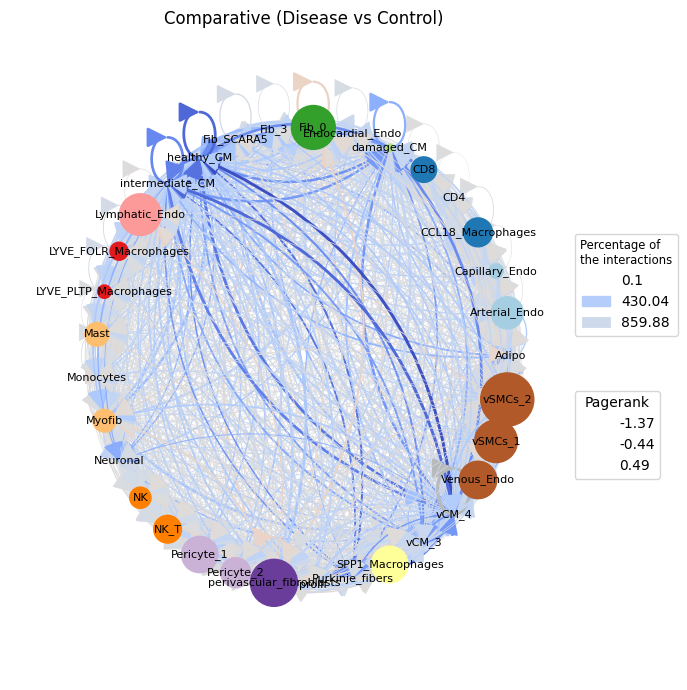

In [8]:
ctpl.plot.plot_cci(graph=adata.uns['pycrosstalker']['results']["graphs"]["ischemic_x_myogenic"],
        colors=adata.uns['pycrosstalker']['results']["colors"],
        plt_name='Comparative (Disease vs Control)',
        coords=adata.uns['pycrosstalker']['results']["coords"],
        emax= None,
        leg= False,
        low= 0,
        high= 0, 
        ignore_alpha= False,
        log= False,
        efactor= 2,
        vfactor= 12, 
        pg= adata.uns['pycrosstalker']['results']["rankings"]["ischemic_x_myogenic"]["Pagerank"],
        figsize= (7, 7),
        scale_factor= 2.0,
        node_size=3.0,
        font_size=8,
        )

In the ischemic condition, CCIs are generally reduced. However, certain cell types remain notably important, as highlighted by their higher Pagerank scores. These key cell types include cardiomyocyte clusters, two of the four fibroblast clusters, and specific myeloid cells, such as SPP1-expressing macrophages and mast cells. These findings indicate that despite the reduced overall interactions, these cell types are predicted to have a central role in the CCI network of the ischemic condition.

pyCrossTalkeR also offers a refined CCI network by employing Fisher’s exact test to filter the network based on interaction proportions. We can plot the resulting statistics in a Volcano Plot:

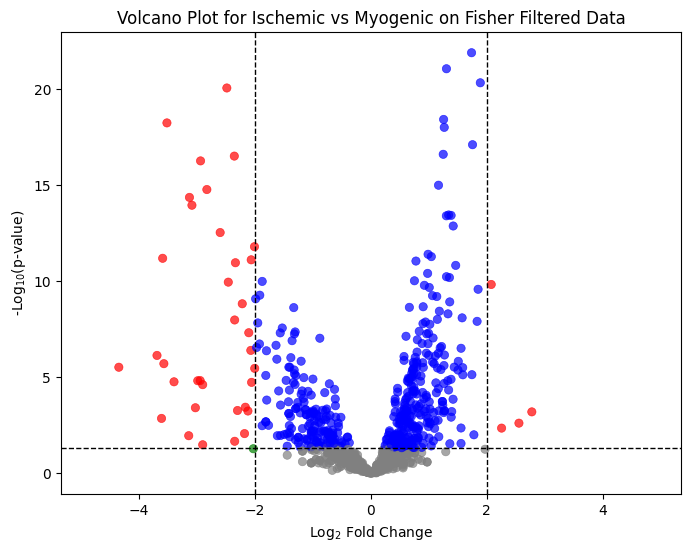

In [9]:
ctpl.plot_volcane(adata.uns['pycrosstalker']['results']['stats']['ischemic_x_myogenic'], "fisher", p_threshold=0.05, fc_threshold=2, annot=False, title="Volcano Plot for Ischemic vs Myogenic on Fisher Filtered Data")

In [10]:
adata.uns['pycrosstalker']['results']['stats']

{'ischemic_x_myogenic':                      cellpair       p_value     lodds  neg_log10_p_value color
 0                 Adipo@Adipo  8.639324e-21 -2.487214          20.063520   red
 1         Adipo@Arterial_Endo  1.324010e-04 -1.166175           3.878109  blue
 2     Adipo@CCL18_Macrophages  8.965582e-05 -1.030422           4.047422  blue
 3                   Adipo@CD4  4.509707e-04 -1.297612           3.345852  blue
 4                   Adipo@CD8  5.946657e-04 -0.998870           3.225727  blue
 ...                       ...           ...       ...                ...   ...
 1084           vSMCs_2@prolif  5.134130e-01  0.189891           0.289533  gray
 1085            vSMCs_2@vCM_3  2.582618e-02  0.555894           1.587940  blue
 1086            vSMCs_2@vCM_4  5.101567e-07  0.796664           6.292296  blue
 1087          vSMCs_2@vSMCs_1  8.397523e-09  1.574920           8.075849  blue
 1088          vSMCs_2@vSMCs_2  2.720834e-10  1.850325           9.565298  blue
 
 [1089 rows x 5

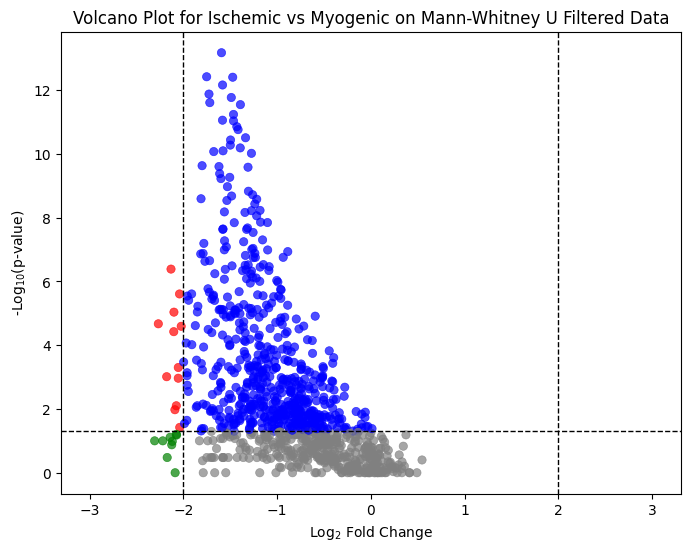

In [11]:
ctpl.plot_volcane(adata.uns['pycrosstalker']['results']['stats']['ischemic_x_myogenic:MannU'], "mannwhitneyu", p_threshold=0.05, fc_threshold=2, annot = False, title="Volcano Plot for Ischemic vs Myogenic on Mann-Whitney U Filtered Data")

Pearson r = 0.397, p = 1.963e-37
Spearman r = 0.367, p = 6.672e-32


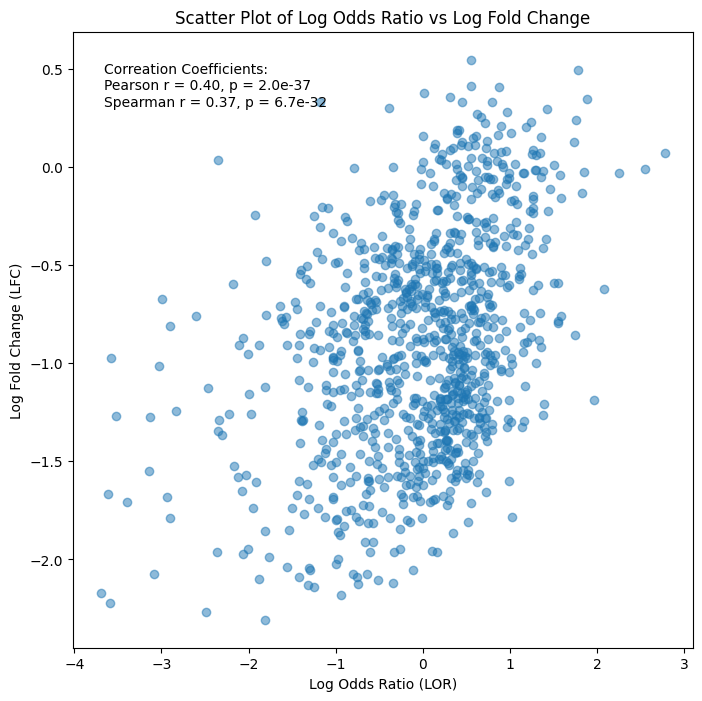

In [12]:
from scipy.stats import pearsonr, spearmanr

x = adata.uns['pycrosstalker']['results']['stats']['ischemic_x_myogenic']
y = adata.uns['pycrosstalker']['results']['stats']['ischemic_x_myogenic:MannU']

merged = pd.merge(x, y, on='cellpair', how='inner')

# Pearson correlation (linear)
r_pearson, p_pearson = pearsonr(merged['lodds'], merged['lfc'])
# Spearman correlation (monotonic/rank-based, more robust to outliers)
r_spearman, p_spearman = spearmanr(merged['lodds'], merged['lfc'])

print(f"Pearson r = {r_pearson:.3f}, p = {p_pearson:.3e}")
print(f"Spearman r = {r_spearman:.3f}, p = {p_spearman:.3e}")

plt.figure(figsize=(8, 8))
plt.scatter(merged['lodds'], merged['lfc'], alpha=0.5)
plt.ylabel('Log Fold Change (LFC)')
plt.xlabel('Log Odds Ratio (LOR)')
plt.title('Scatter Plot of Log Odds Ratio vs Log Fold Change')
plt.text(
    0.05, 0.95, 
    f"Correation Coefficients:\n"
    f"Pearson r = {r_pearson:.2f}, p = {p_pearson:.1e}\n"
    f"Spearman r = {r_spearman:.2f}, p = {p_spearman:.1e}",
    transform=plt.gca().transAxes,  # relative coordinates (0–1)
    fontsize=10, 
    verticalalignment='top'
)
plt.show()

Statistically significant points are labeled with the names of the corresponding edge pairs, with the significance threshold set to a p-value greater than 0.05 and a log2 fold change above one. We see that many of these significant interactions involve high Pagerank cell types, including fibroblast, cardiomyocyte, and myeloid cell clusters. Using this threshold (the default in CrossTalkeR), we can retain only interacting cell pairs with a p-value greater than 0.05 as an example, and replot the CCI network:

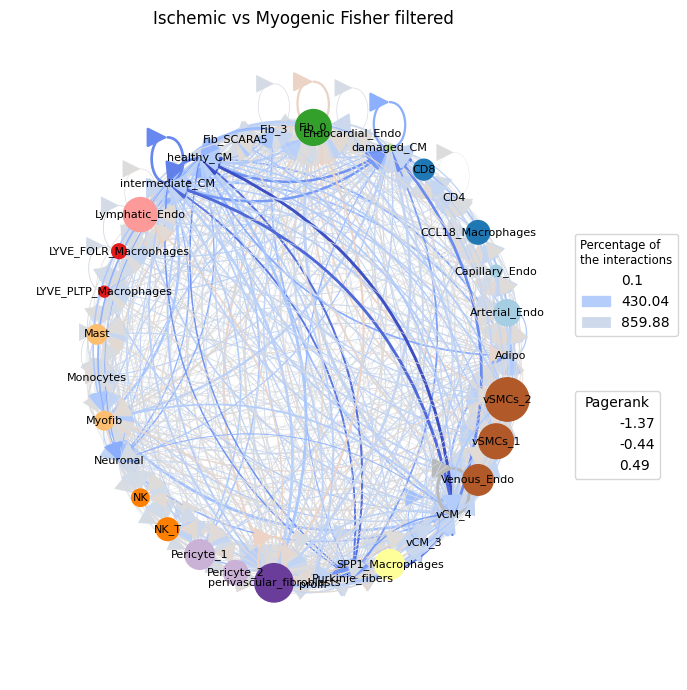

In [13]:
ctpl.plot.plot_cci(graph=adata.uns['pycrosstalker']['results']["graphs"]["ischemic_x_myogenic_filtered"],
        colors=adata.uns['pycrosstalker']['results']["colors"],
        plt_name='Ischemic vs Myogenic Fisher filtered',
        coords=adata.uns['pycrosstalker']['results']["coords"],
        emax= None,
        leg= False,
        low= 0,
        high= 0, 
        ignore_alpha= False,
        log= False,
        efactor= 2,
        vfactor= 12, 
        pg= adata.uns['pycrosstalker']['results']["rankings"]["ischemic_x_myogenic_filtered"]["Pagerank"],
        figsize= (7, 7),
        scale_factor= 2.0,
        node_size=2.0,
        font_size=8,
        )

In the filtered CCI plot, positive edges become more visible, though all cell types remain except for the Neuronal and Purkinje_fibers clusters. The Pagerank of the nodes remains largely unchanged.

We can also examine the filtered CCI network with the help of a heatmap:

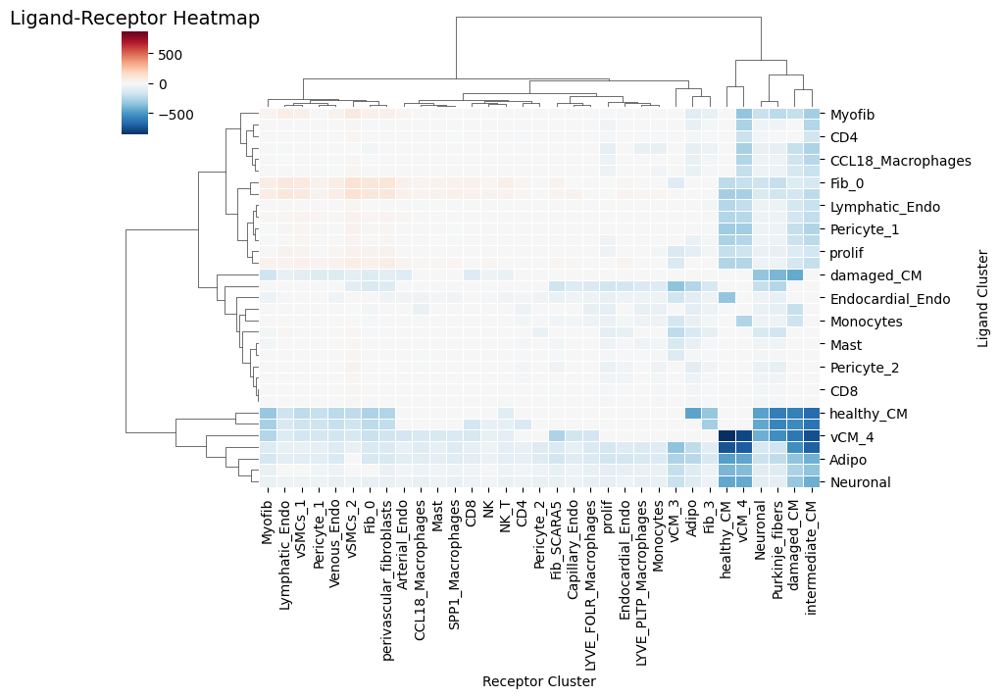

In [14]:
ctpl.plot_graph_clustermap(adata.uns['pycrosstalker']['results']['graphs']['ischemic_x_myogenic_filtered'], annot=False)

The heatmap provides a more detailed view of the interactions between cell types. The color intensity corresponds to the edge weight in the CCI plot, with red indicating a positive and blue indicating a negative interaction score in the ischemic condition. The sender cell type (Receptor cluster) is on the x axis, and the receiving cell type (Ligand Cluster) on the y axis. We can use the order of the cell types in the heatmap to reorder the nodes in the CCI plot. Here we are sorting the nodes by the order of the sending clusters in the heatmap.

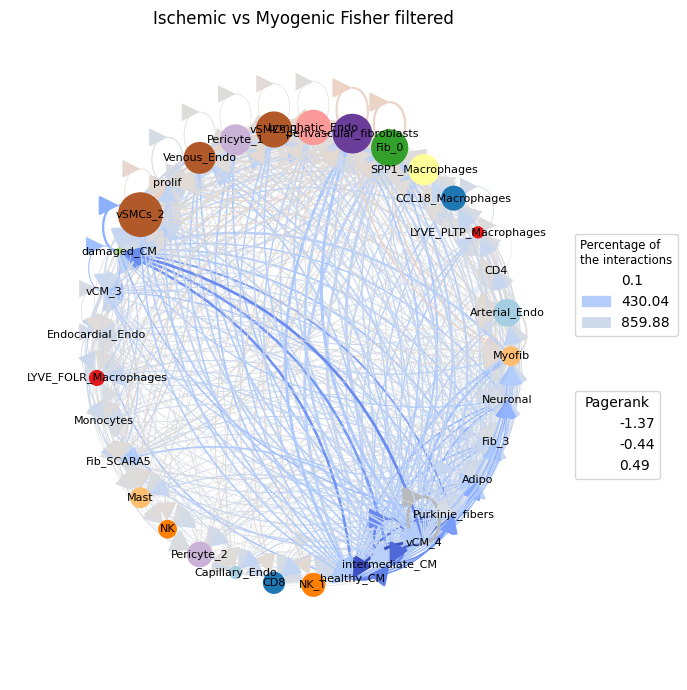

In [15]:
ordered_nodes = cttl.get_clustered_node_order(adata.uns['pycrosstalker']['results']['graphs']['ischemic_x_myogenic_filtered'], weight="LRScore")
coords = cttl.create_ordered_circular_layout(ordered_nodes)

graph = nx.from_pandas_edgelist(adata.uns['pycrosstalker']['results']['graphs']['ischemic_x_myogenic_filtered'],
                                    source='source',
                                    target='target',
                                    edge_attr=True,
                                    create_using=nx.DiGraph())

ctpl.plot.plot_cci(graph=adata.uns['pycrosstalker']['results']['graphs']['ischemic_x_myogenic_filtered'],
        colors=adata.uns['pycrosstalker']['results']['colors'],
        plt_name='Ischemic vs Myogenic Fisher filtered',
        coords={n: coords[n] for n in graph.nodes if n in coords},
        emax=None,
        leg=False,
        low=0,
        high=0,
        ignore_alpha=False,
        log=False,
        efactor=2,
        vfactor=12,
        pg=adata.uns['pycrosstalker']['results']['rankings']['ischemic_x_myogenic_filtered']['Pagerank'],
        figsize= (7, 7),
        scale_factor= 2.0,
        node_size=2.0,
        font_size=8,
        )

To confirm the top cell types identified by Pagerank, we can examine their Pagerank scores in more detail using a bar plot:

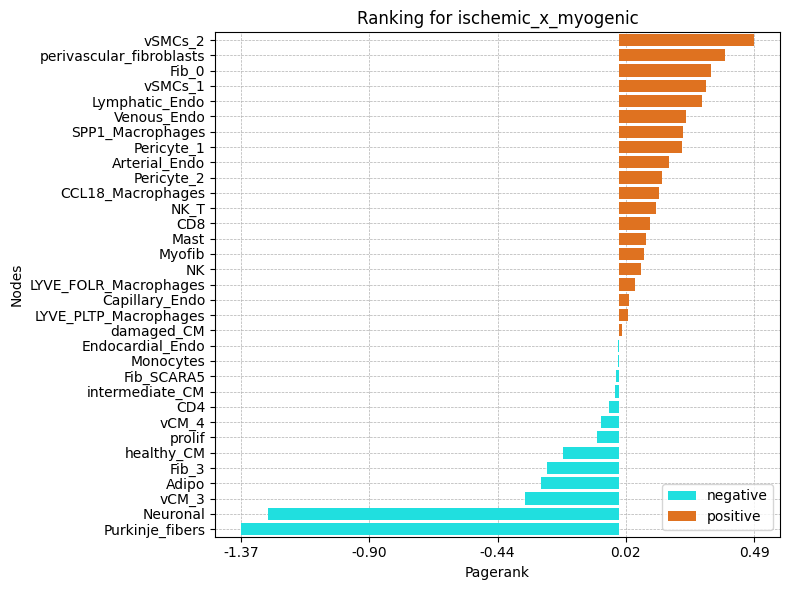

In [16]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic", "Pagerank")

We can further take a look at the Influencer and Listener ranking to observe which cell types are more sending or more receiving:

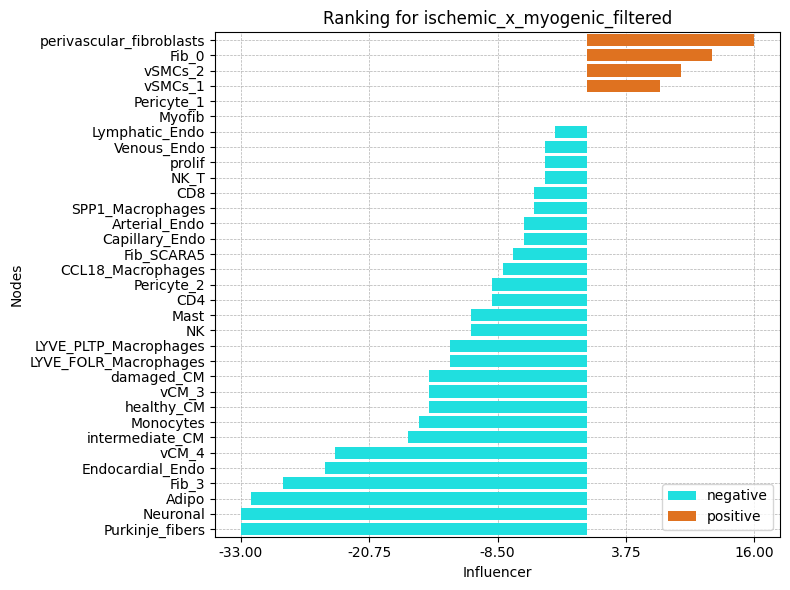

In [17]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic_filtered", "Influencer")

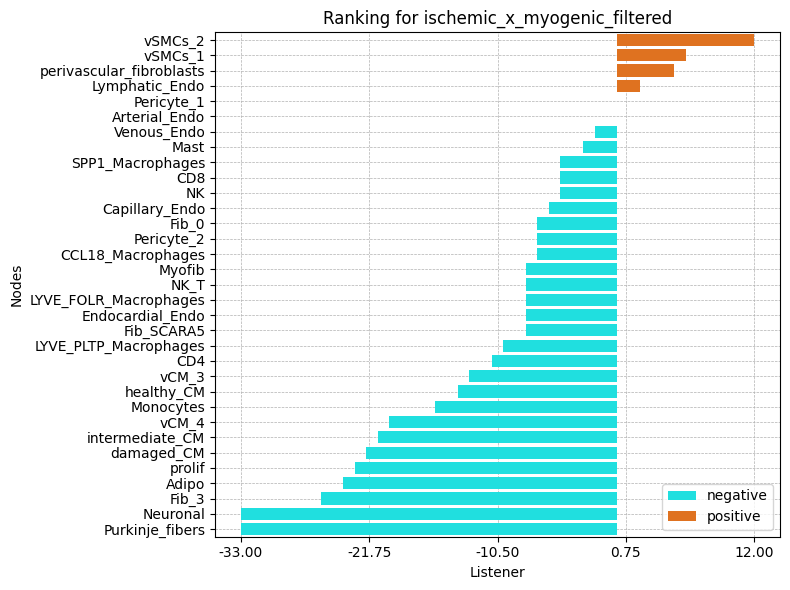

In [18]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic_filtered", "Listener")

These plots highlight that nearly all cell types are predicted to communicate less in the ischemic condition compared to the myogenic condition. Exceptions include the Fib_0 and Perivascular Fibroblasts clusters, which exhibit a higher Influencer Score in the ischemic condition (indicating more outgoing signals). Additionally, the vSMCs_2, Perivascular fibroblasts, and vSMCs_1 clusters show a higher Listener Score, indicating more incoming signals in ischemia.

Most of the observations at the CCI level are consistent with the findings in the paper. For instance, fibrotic structures are more prominent in the ischemic condition, which is also reflected in the Pagerank scores, as at least two out of the four fibroblast clusters have a higher Pagerank in the ischemic condition.

### CGI Results

Next, we shift to the gene-cell interaction (GCI) level. Similar to the CCI level, we can examine the network’s topological rankings. We begin by reviewing the top Pagerank results, which identify genes within a specific cell type that are important in the network’s signaling. For now, we will focus exclusively on ligand-receptor (LR) interactions.

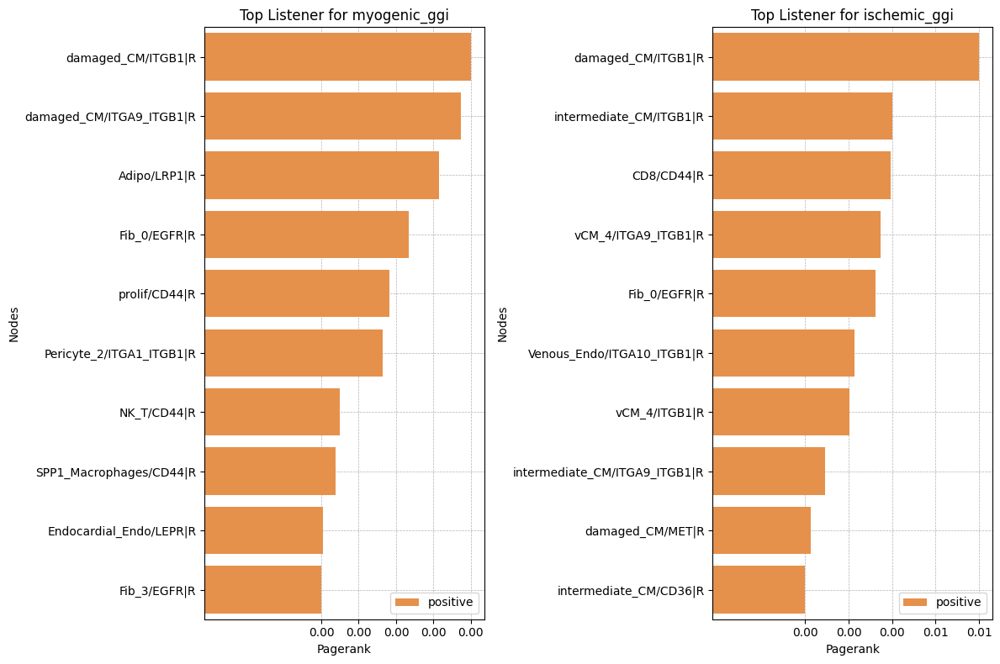

In [19]:
rankings_table_myogenic = adata.uns['pycrosstalker']['results']['rankings']['myogenic_ggi']
rankings_table_myogenic = rankings_table_myogenic.sort_values(by='Pagerank')
rankings_table_myogenic['signal'] = ['negative' if x < 0 else 'positive' for x in rankings_table_myogenic['Pagerank']]

rankings_table_myogenic_tail = rankings_table_myogenic[-10:]

rankings_table_ischemic = adata.uns['pycrosstalker']['results']['rankings']['ischemic_ggi']
rankings_table_ischemic = rankings_table_ischemic.sort_values(by='Pagerank')
rankings_table_ischemic['signal'] = ['negative' if x < 0 else 'positive' for x in rankings_table_ischemic['Pagerank']]

rankings_table_ischemic_tail = rankings_table_ischemic[-10:]

#Plot
custom_palette = {'positive': '#FF8E32', 'negative':'#ff3e3e'}  # Orange and Blue
fig, axes = plt.subplots(1, 2, figsize=(12, 8), sharey=False)  # 1 row, 2 columns

sns.barplot(x='Pagerank', y='nodes', data=rankings_table_myogenic_tail, hue='signal', dodge=False, palette=custom_palette, ax=axes[0])
axes[0].set_title('Top Listener for myogenic_ggi')
axes[0].set_xlabel('Pagerank')
axes[0].set_ylabel('Nodes')

sns.barplot(x='Pagerank', y='nodes', data=rankings_table_ischemic_tail, hue='signal', dodge=False, palette=custom_palette, ax=axes[1])
axes[1].set_title("Top Listener for ischemic_ggi")
axes[1].set_xlabel('Pagerank')
axes[1].set_ylabel('Nodes')

# Set x-axis tick intervals
max_val = rankings_table_myogenic_tail['Pagerank'].max()
min_val = rankings_table_myogenic_tail['Pagerank'].min()
ticks = np.linspace(min_val, max_val, num=5)  # Adjust 'num' for more/less intervals
axes[0].set_xticks(ticks, [f'{tick:.2f}' for tick in ticks])

max_val = rankings_table_ischemic_tail['Pagerank'].max()
min_val = rankings_table_ischemic_tail['Pagerank'].min()
ticks = np.linspace(min_val, max_val, num=5)  # Adjust 'num' for more/less intervals
axes[1].set_xticks(ticks, [f'{tick:.2f}' for tick in ticks])

for ax in axes:
    # Invert y-axis to have highest values at the top
    ax.invert_yaxis()

    # Show the legend only once
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='lower right')

    ax.grid(True, linestyle='--', linewidth=0.5)
    ax.set_axisbelow(True)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


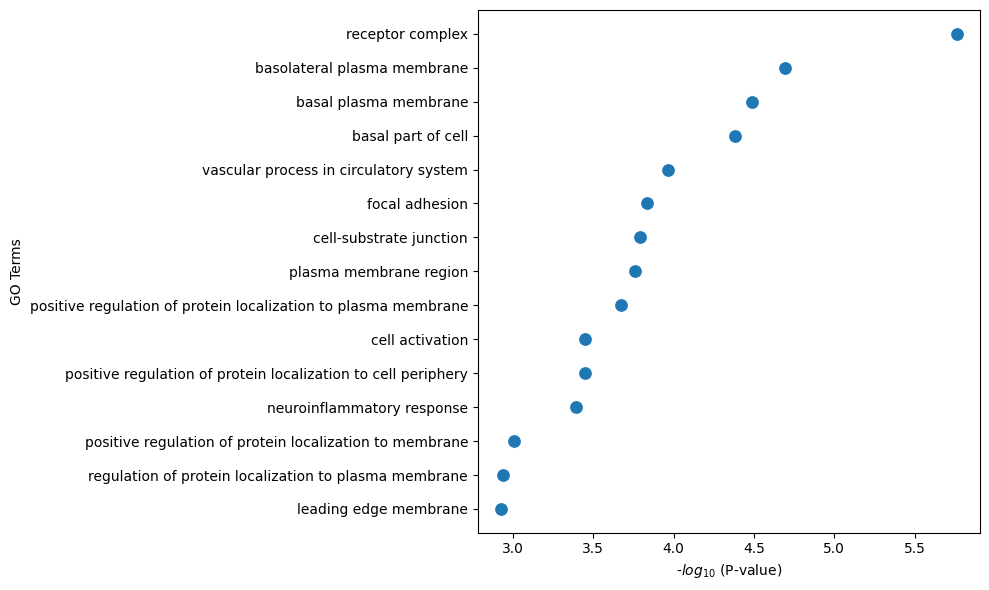

In [20]:
top_listener_myogenic_ggi_genes = list(i.split('|')[0].split('/')[1] for i in rankings_table_myogenic_tail['nodes'])
top_listener_ischemic_ggi_genes = list(i.split('|')[0].split('/')[1] for i in rankings_table_ischemic_tail['nodes'])

ctpl.plot.gene_annotation(gene_list_to_profile=top_listener_myogenic_ggi_genes,
                          num_gos=15,
                          figsize=(10,6))



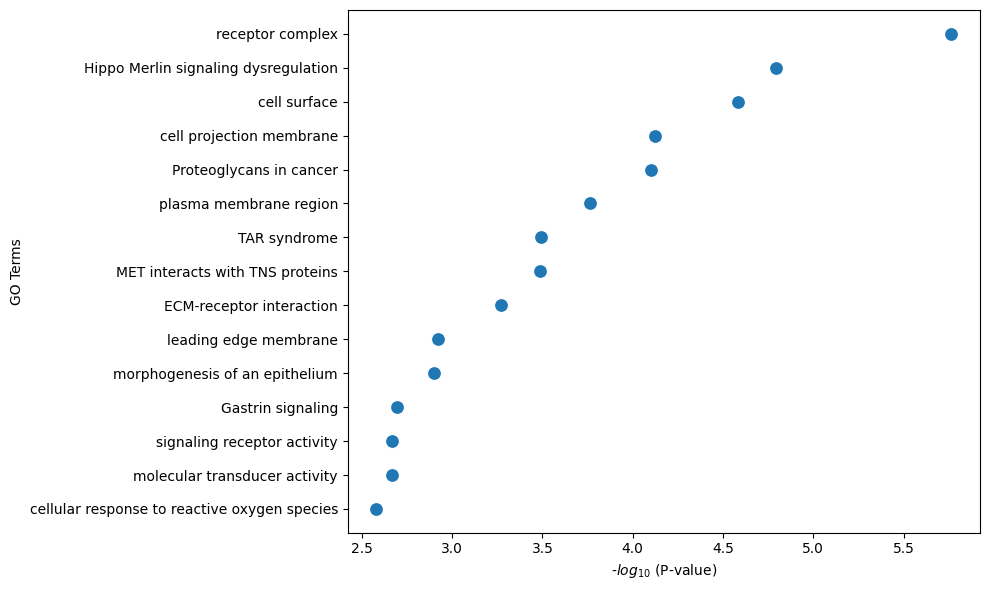

In [21]:
ctpl.plot.gene_annotation(gene_list_to_profile=top_listener_ischemic_ggi_genes,
                          num_gos=15,
                          figsize=(10,6))

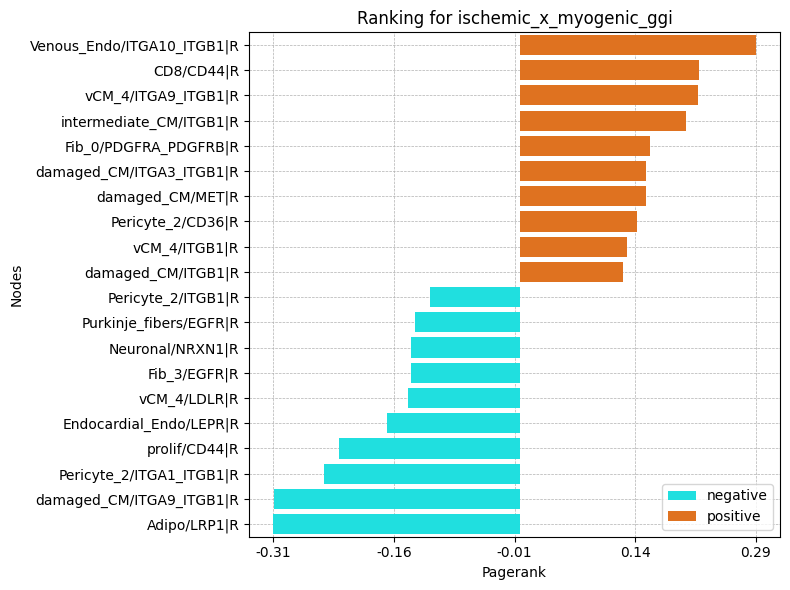

In [22]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic_ggi", "Pagerank", type="LR", mode="cgi")

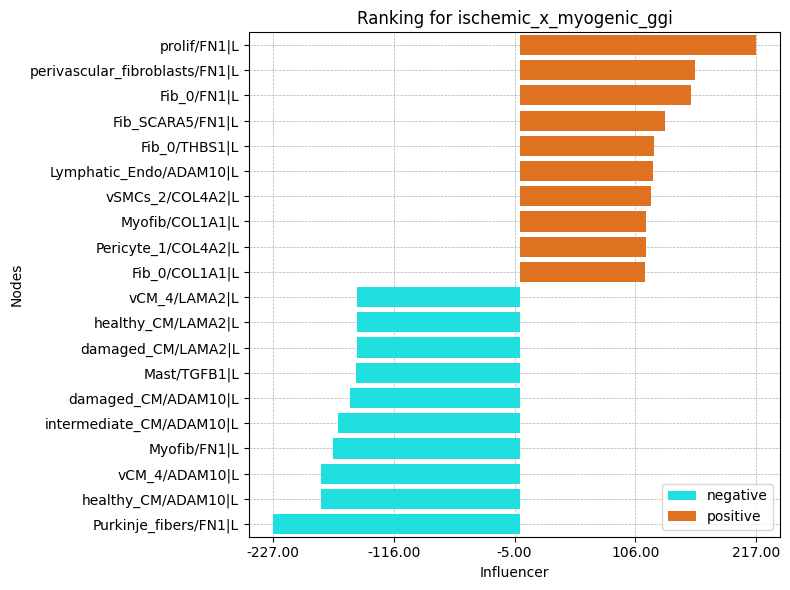

In [23]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic_ggi", "Influencer", type="L", mode="cgi")

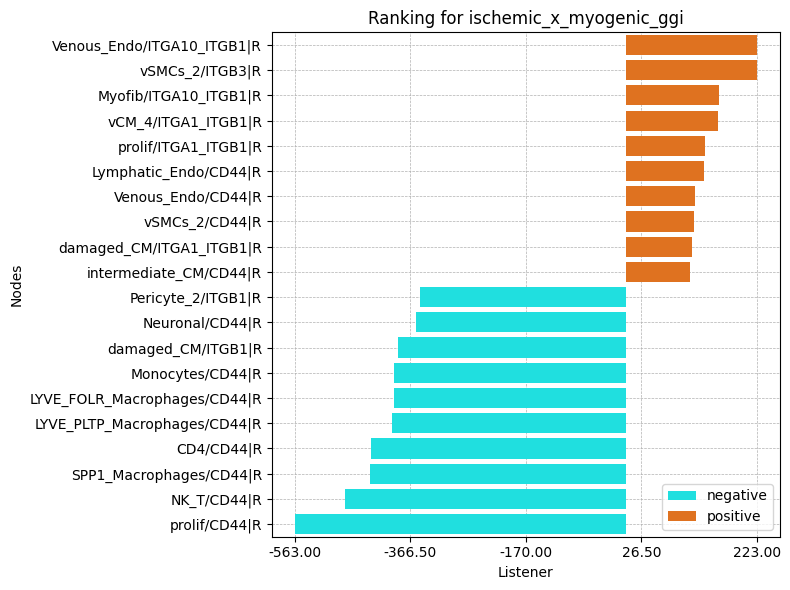

In [24]:
ctpl.plot_bar_rankings(adata, "ischemic_x_myogenic_ggi", "Listener", type="R", mode="cgi")

Next, we create the Sankey plots for the ischemic vs. myogenic comparisons, as shown in extended figures 12d and e in the original paper. It is important to note that these plots may differ slightly, as we are using newer versions of the LIANA package and, for simplicity, we are considering fewer samples in this tutorial.

We begin with the Sankey plots showing signaling between the vSMCs_2 and vCM_4 clusters (in both directions):

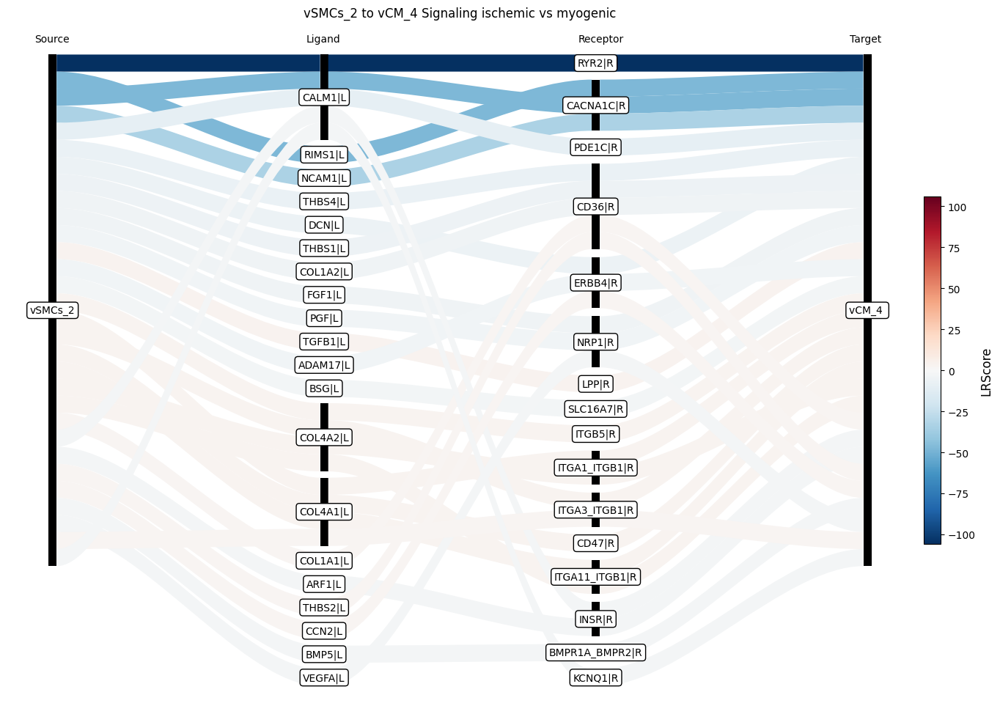

In [25]:
ctpl.plot_sankey(
    adata.uns['pycrosstalker']['results']['tables']['ischemic_x_myogenic'],
    ligand_cluster = ["vSMCs_2"],
    receptor_cluster = ["vCM_4"],
    plt_name = "vSMCs_2 to vCM_4 Signaling ischemic vs myogenic",
    threshold = 30)

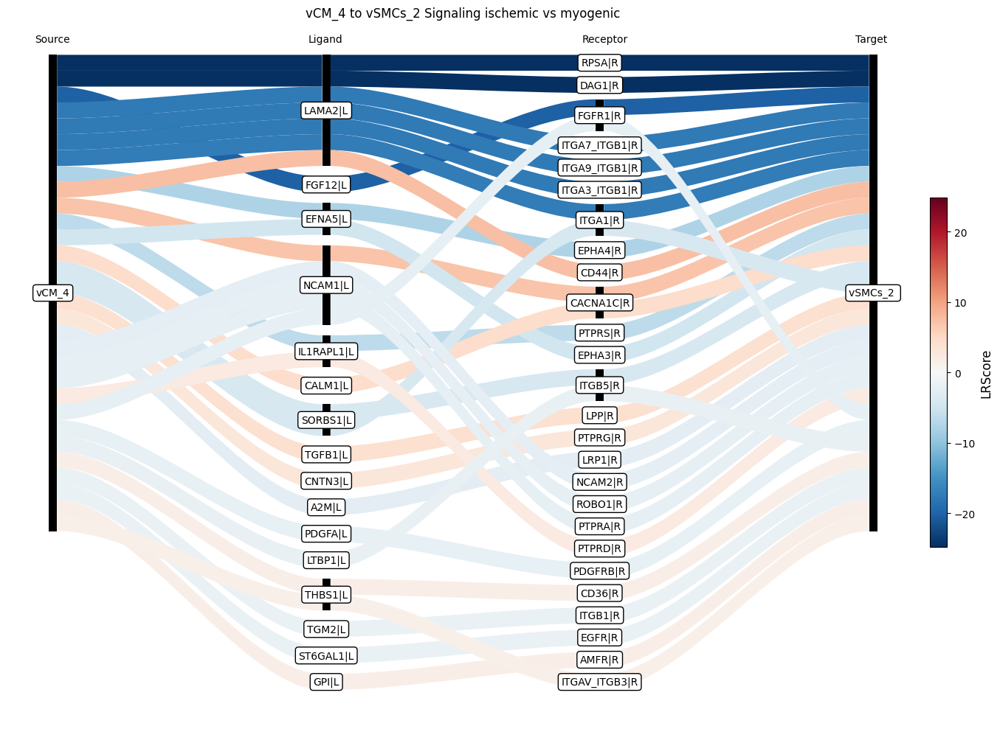

In [26]:
ctpl.plot_sankey(
    adata.uns['pycrosstalker']['results']['tables']['ischemic_x_myogenic'],
    ligand_cluster = ["vCM_4"],
    receptor_cluster = ["vSMCs_2"],
    plt_name = "vCM_4 to vSMCs_2 Signaling ischemic vs myogenic",
    threshold = 30)

Additionally, a Sankey plot was created for a subset of cell types, displaying only interactions involving the TGFB1 ligand:

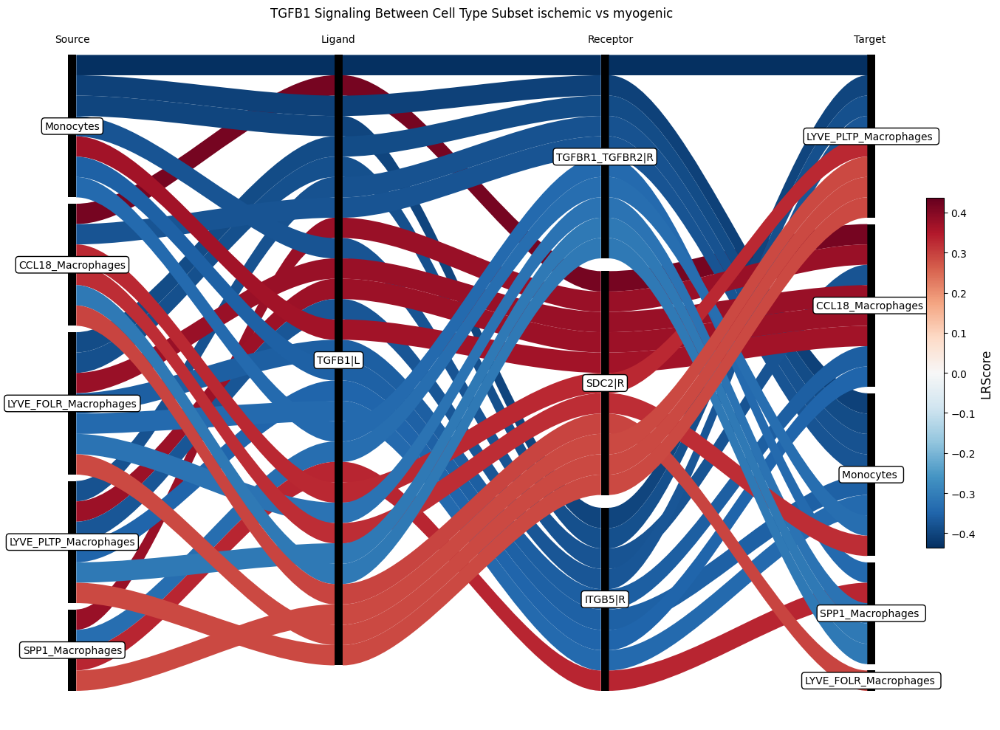

In [27]:
set = ["LYVE_FOLR_Macrophages",
"LYVE_PLTP_Macrophages",
"CCL18_Macrophages",
"SPP1_Macrophages",
"Monocytes",
"Fib4_COL15A1",
"Fib3_C7",
"Fib2_Myofib",
"Fib1_SCARA5"]

ctpl.plot_sankey(
    adata.uns['pycrosstalker']['results']['tables']['ischemic_x_myogenic'],
    target= "TGFB1|L",
    ligand_cluster = set,
    receptor_cluster = set,
    plt_name = "TGFB1 Signaling Between Cell Type Subset ischemic vs myogenic",
    threshold = 30)